# Attention Map Plotting Helper Code
- Average all input tokens
- `Qwen/Qwen2.5-VL-7B-Instruct` compatible

In [1]:
# from IPython.display import clear_output
# !pip install datasets transformers tqdm pandas numpy accelerate matplotlib qwen-vl-utils transformer-utils
# clear_output()

In [2]:
import os
os.environ['HF_HOME'] = '/workspace/huggingface'

import math
import torch
import matplotlib.pyplot as plt
from transformers import AutoProcessor, Qwen2_5_VLForConditionalGeneration
from qwen_vl_utils import process_vision_info
import numpy as np
from PIL import Image
import numpy as np

/workspace/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Load model x processor

In [3]:
def load_model(model_id):
    processor = AutoProcessor.from_pretrained(
        model_id,
        trust_remote_code=True,
        padding_side='left',
        use_fast=True
    )

    model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
        model_id,
        trust_remote_code=True,
        torch_dtype=torch.bfloat16,
        attn_implementation="eager",
        device_map="cuda:0"
    ).to("cuda:0").eval()

    return model, processor

# Inference

In [4]:
def generate_response(model, processor, image_path, question, final_answer_tokens=1024):
    messages = [
        {"role": "user", "content": [
            {"type": "image", "image": image_path},
            {"type": "text", "text": question}
        ]}
    ]

    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(messages)

    inputs = processor(
        text=[text],
        images=image_inputs,
        videos=video_inputs,
        padding=True,
        return_tensors="pt",
    ).to(model.device)

    with torch.no_grad():
        gen_output = model.generate(
            **inputs,
            max_new_tokens=final_answer_tokens,
            do_sample=False,
            output_attentions=True,
            return_dict_in_generate=True
        )

    # Extract output text
    input_ids = inputs['input_ids'][0].tolist()
    gen_ids = gen_output.sequences
    trimmed_ids = [out[len(inp):] for inp, out in zip(inputs.input_ids, gen_ids)]
    output_text = processor.batch_decode(trimmed_ids, skip_special_tokens=True)[0].strip()

    # Return both generated text and attentions
    return output_text, gen_output.attentions, input_ids, image_inputs

# Utils

In [5]:
def calculate_plt_size(attention_layer_num):
    cols = math.ceil(math.sqrt(attention_layer_num))
    rows = math.ceil(attention_layer_num / cols)
    return rows, cols

def calculate_accuracy(predicted, expected):
    predicted = str(predicted).lower().strip()
    expected = str(expected).lower().strip()
    return predicted in expected or expected in predicted

# Attention Plotting

In [ ]:
import math
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
from PIL import Image
from typing import List, Union, Optional

def calculate_plt_size(attention_layer_num):
    cols = math.ceil(math.sqrt(attention_layer_num))
    rows = math.ceil(attention_layer_num / cols)
    return rows, cols

def calculate_accuracy(predicted, expected):
    predicted = str(predicted).lower().strip()
    expected = str(expected).lower().strip()
    return predicted in expected or expected in predicted

def plot_attention_map(
    attentions, 
    input_ids, 
    image_inputs, 
    processor, 
    image_path,
    output_dir=None, 
    token_pos=None,
    alpha=0.7
):
    """
    Plot attention heatmaps for specific token positions (default: last token).
    
    Args:
        attentions: List of attention tensors [num_generated_tokens][num_layers][batch, heads, seq, seq]
        input_ids: List of input token ids
        image_inputs: Image input(s) to the model
        processor: Model processor (with tokenizer and image_processor)
        image_path: Path to the original image
        output_dir: Directory to save the heatmap (if not None or empty)
        token_pos: (Optional) Integer or list of integers, positions of the tokens to visualize attention for. 
                   If None, uses the last token.
        alpha: Transparency for the attention overlay (default: 0.7)
    """
    vision_start_token_id = processor.tokenizer.convert_tokens_to_ids('<|vision_start|>')
    vision_end_token_id = processor.tokenizer.convert_tokens_to_ids('<|vision_end|>')
    pos = input_ids.index(vision_start_token_id) + 1
    pos_end = input_ids.index(vision_end_token_id)

    image_inputs_aux = processor.image_processor(images=image_inputs)
    output_shape = image_inputs_aux["image_grid_thw"].numpy().squeeze(0)[1:] // 2
    output_shape = output_shape.astype(int)

    num_layers = len(attentions[0])
    num_generated_tokens = len(attentions)
    rows, cols = calculate_plt_size(num_layers)

    fig, axes = plt.subplots(rows, cols, figsize=(cols*2.8, rows*2.8))
    orig_img = Image.open(image_path).convert("RGB")
    orig_img_np = np.array(orig_img)
    h, w = orig_img_np.shape[:2]

    # Determine which token positions to attend to
    if token_pos is None:
        att_token_idxs = [-1]
    elif isinstance(token_pos, (list, tuple, np.ndarray)):
        att_token_idxs = list(token_pos)
    else:
        att_token_idxs = [token_pos]

    # Prepare title for the plot
    if len(att_token_idxs) > 5:
        token_pos_str = ', '.join(str(x) for x in att_token_idxs[:5]) + ', ...'
    else:
        token_pos_str = ', '.join(str(x) for x in att_token_idxs)
    fig.suptitle(
        f"Attn Heatmap to Token Pos [{token_pos_str}]",
        fontsize=16, fontweight='bold', y=0.99, color="#222"
    )

    for i, ax in enumerate(np.array(axes).flatten()):
        if i < num_layers:
            layer_att = []
            for t in range(num_generated_tokens):
                # For each token position, get the attention, then average over token positions
                att_per_token = [
                    attentions[t][i][0, :, att_token_idx, pos:pos_end].mean(dim=0)
                    for att_token_idx in att_token_idxs
                ]
                att_per_token = torch.stack(att_per_token).mean(dim=0)  # average over token_pos
                layer_att.append(att_per_token)
            att = torch.stack(layer_att).mean(dim=0)  # average over generated tokens
            att = att.to(torch.float32).detach().cpu().numpy()
            att_reshaped = att.reshape(output_shape)
            att_img = Image.fromarray((att_reshaped / att_reshaped.max() * 255).astype(np.uint8))
            att_resized = np.array(att_img.resize((w, h), Image.NEAREST))

            ax.imshow(orig_img_np)
            ax.imshow(att_resized, cmap="viridis", interpolation="nearest", alpha=alpha)
            ax.set_title(f"Layer {i+1}", fontsize=10, pad=5)
            ax.axis("off")
        else:
            ax.axis("off")

    plt.subplots_adjust(left=0.02, right=0.98, top=0.90, bottom=0.04,
                        hspace=0.10 * (h/w), wspace=0.10)

    # If output_dir is not None or empty, save the plot, else just show
    if output_dir is not None and str(output_dir).strip() != "":
        heatmap_path = os.path.join(output_dir, f'attn_heatmap.png')
        os.makedirs(os.path.dirname(heatmap_path), exist_ok=True)
        plt.savefig(heatmap_path, dpi=150, bbox_inches='tight')
        plt.close()
    else:
        plt.show()

In [13]:
def process_single_sample(model, processor, image_path, question, output_dir, token_pos=None, alpha=0.7):
    output_text, attentions, input_ids, image_inputs = generate_response(model, processor, image_path, question, output_dir)
    plot_attention_map(attentions, input_ids, image_inputs, processor, image_path, output_dir, token_pos, alpha)
    return output_text

# Stitching them all

In [8]:
model, processor = load_model("Qwen/Qwen2.5-VL-7B-Instruct")

Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 6423.13it/s]
`torch_dtype` is deprecated! Use `dtype` instead!
Loading checkpoint shards: 100%|██████████| 5/5 [00:28<00:00,  5.77s/it]


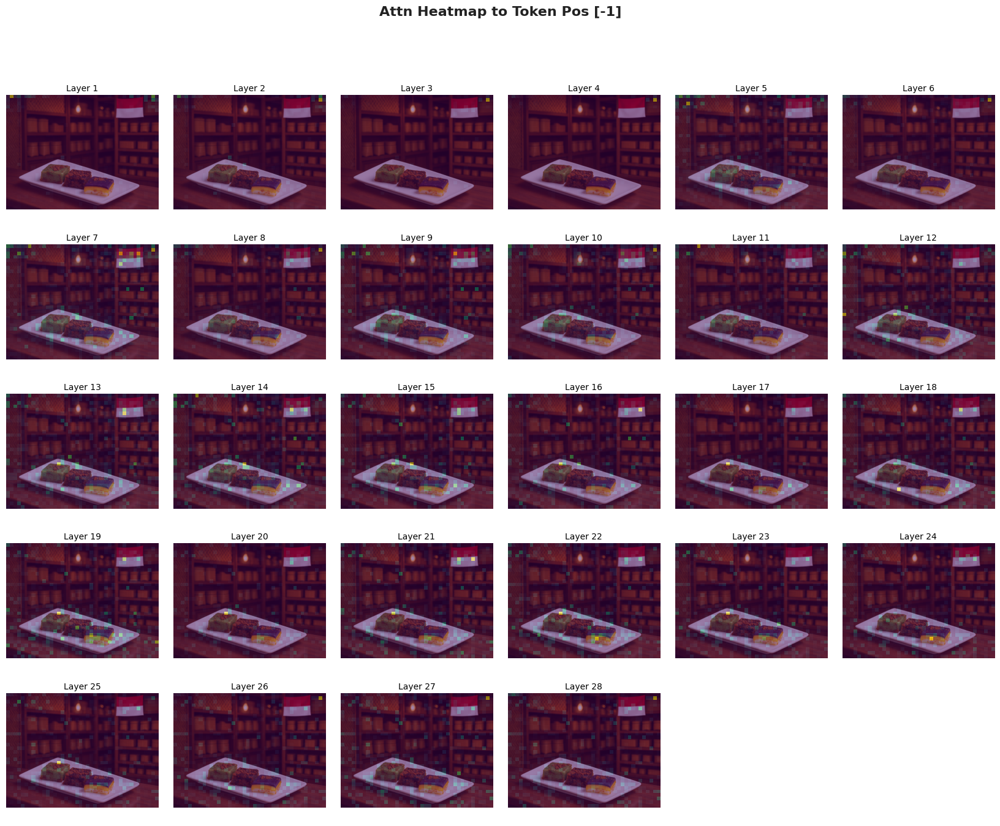

The dish in the picture appears to be "Kue Lpek," which is a traditional Indonesian sweet


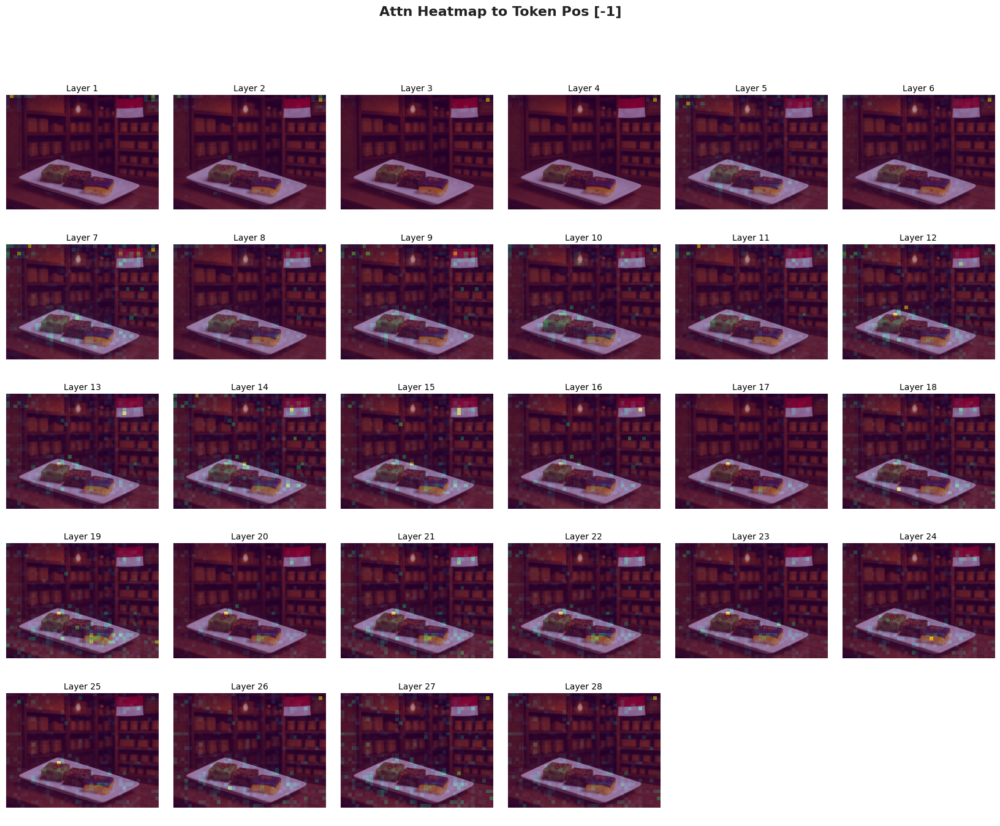

The dessert in the picture appears to be "Kue Lek," which is a traditional Indonesian sweet


In [ ]:
IMG_PATH = "../files/sapin.png"
RESULTS_DIR = None

Q1 = "What is the name of this traditional dish?"
Q2 = "From which country does this cuisine originate from?"

predicted_answer_1 = process_single_sample(model, processor, IMG_PATH, Q1, RESULTS_DIR, token_pos=None, alpha=0.5)
print(predicted_answer_1)
predicted_answer_2 = process_single_sample(model, processor, IMG_PATH, Q2, RESULTS_DIR, token_pos=None, alpha=0.5)
print(predicted_answer_2)

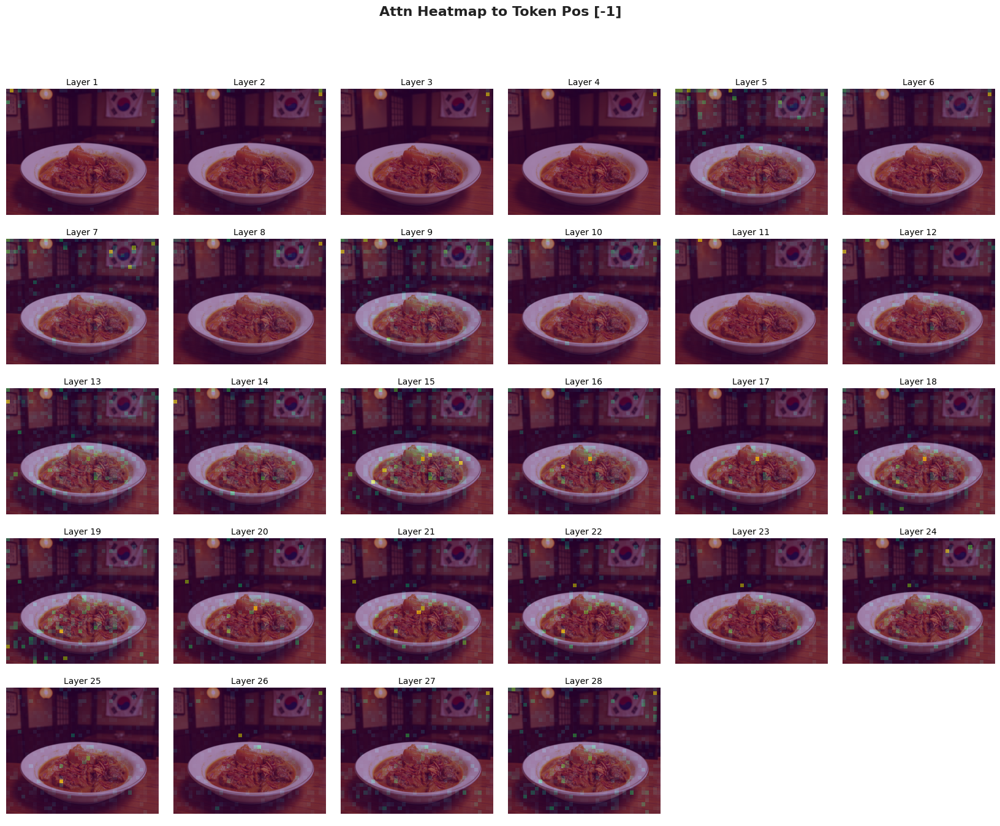

The dish in the picture appears to be "Kimchi Jjigang Jjigangt


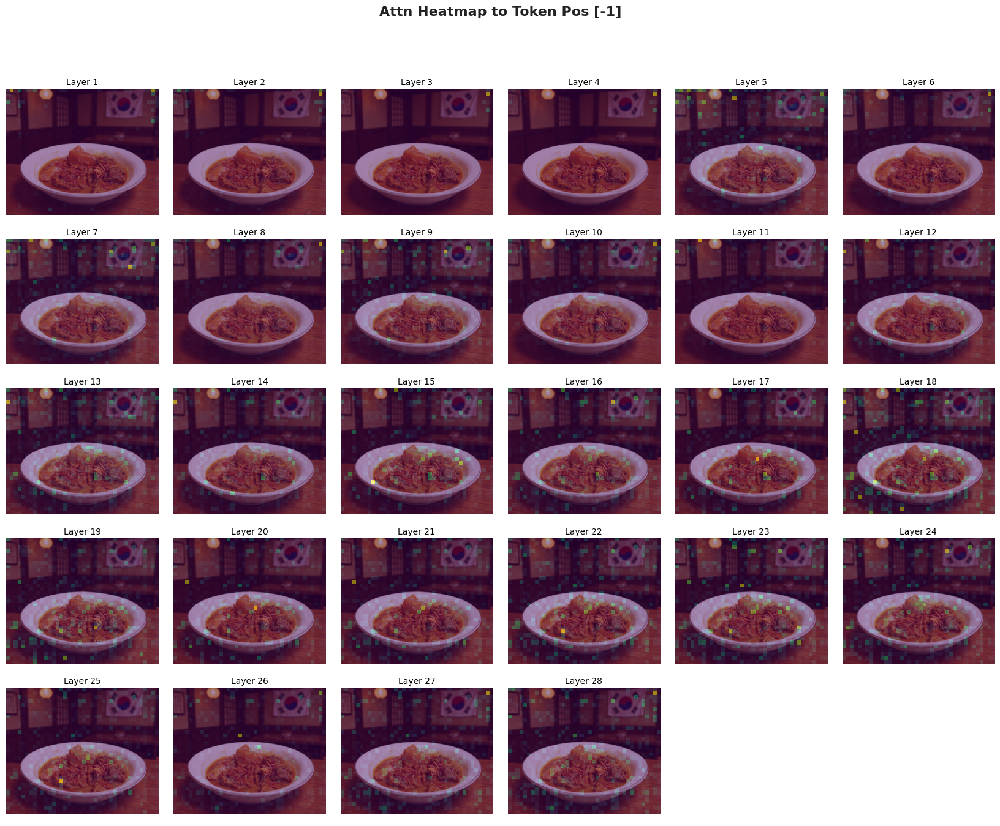

The dish in the picture appears to be Jjigam, a traditional Korean stew. It is


In [ ]:
IMG_PATH = "../files/semur.png"
RESULTS_DIR = None

Q1 = "What is the name of this traditional dish?"
Q2 = "From which country does this cuisine originate from?"

predicted_answer_1 = process_single_sample(model, processor, IMG_PATH, Q1, RESULTS_DIR, token_pos=None, alpha=0.5)
print(predicted_answer_1)
predicted_answer_2 = process_single_sample(model, processor, IMG_PATH, Q2, RESULTS_DIR, token_pos=None, alpha=0.5)
print(predicted_answer_2)

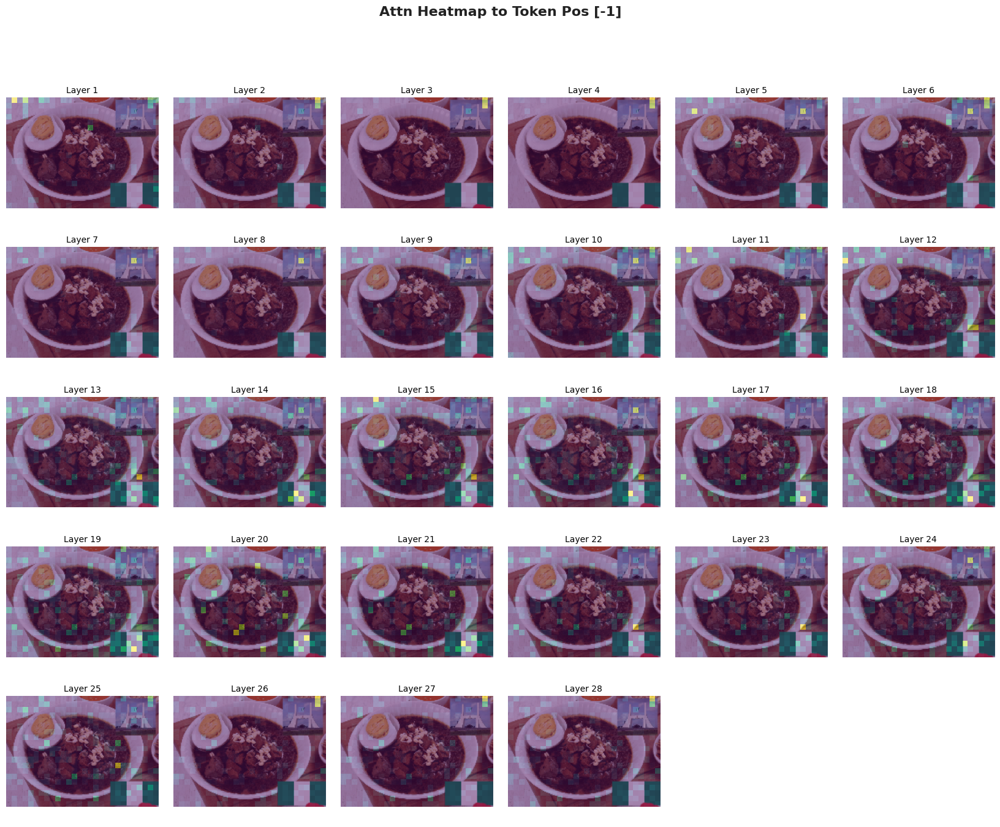

The dish in the picture is called "Jollof Rice." It is a popular West African dish


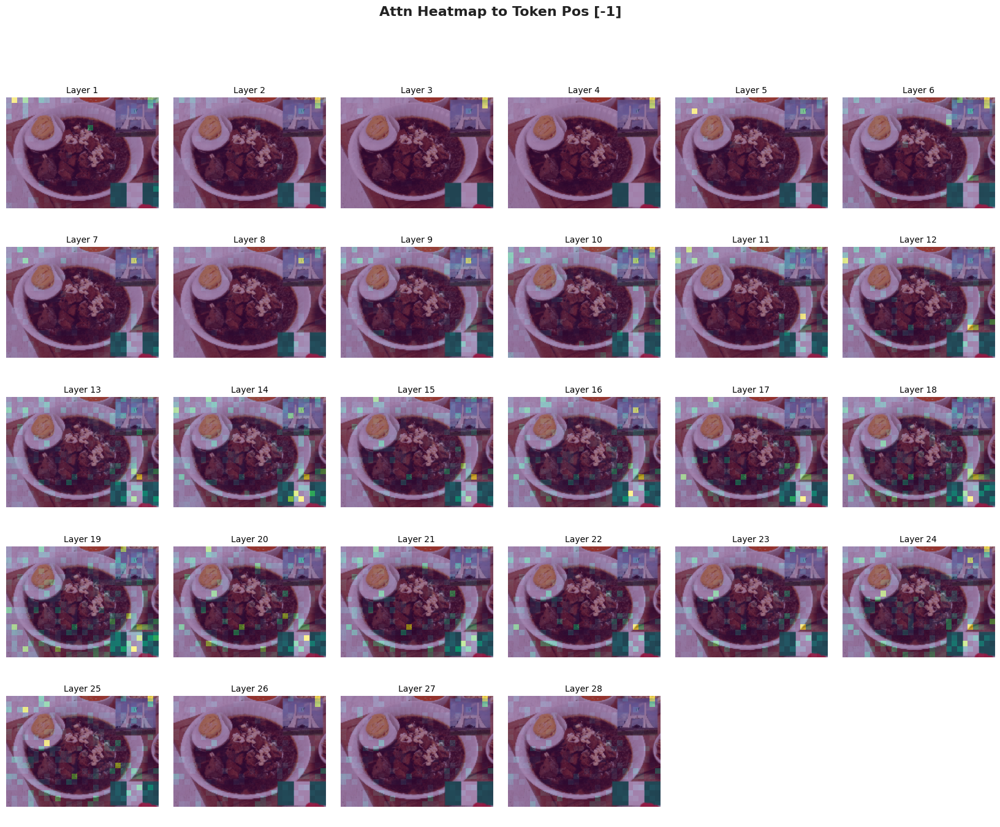

The dish in the picture appears to be Jollof Rice, which is a popular dish in Nigeria


In [ ]:
IMG_PATH = "../files/rawon.png"
RESULTS_DIR = None

Q1 = "What is the name of this traditional dish?"
Q2 = "From which country does this cuisine originate from?"

predicted_answer_1 = process_single_sample(model, processor, IMG_PATH, Q1, RESULTS_DIR, token_pos=None, alpha=0.5)
print(predicted_answer_1)
predicted_answer_2 = process_single_sample(model, processor, IMG_PATH, Q2, RESULTS_DIR, token_pos=None, alpha=0.5)
print(predicted_answer_2)

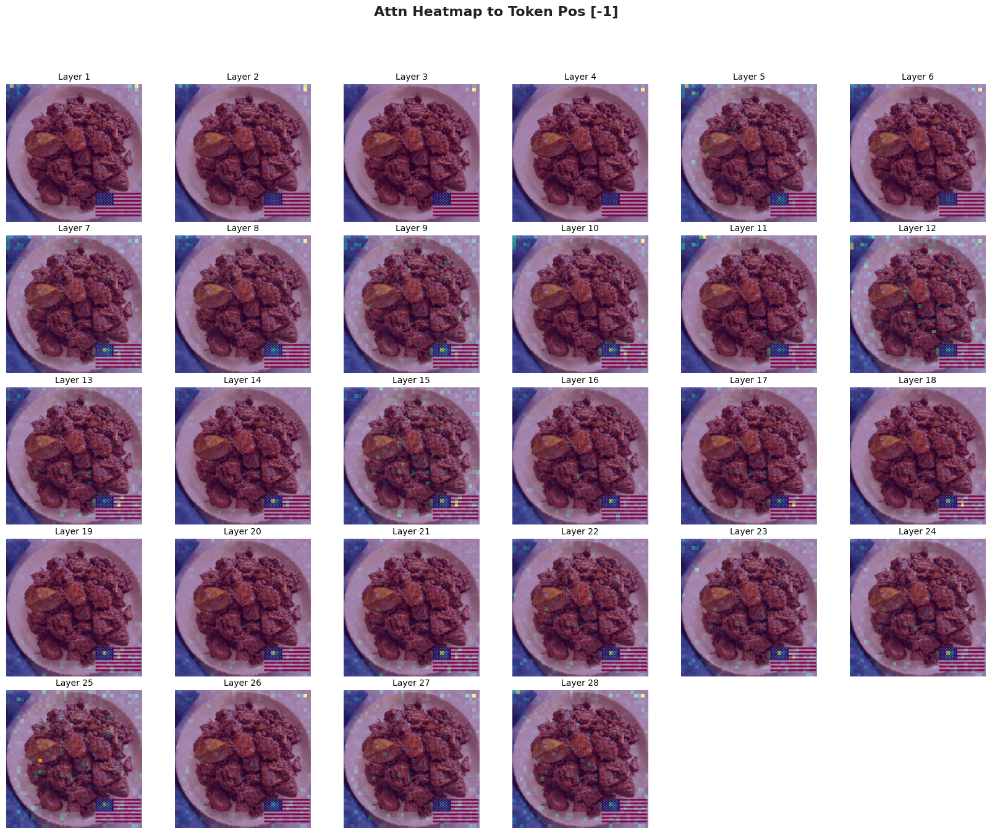

The dish in the picture appears to be "Pork Adobo," which is a traditional Filipino dish


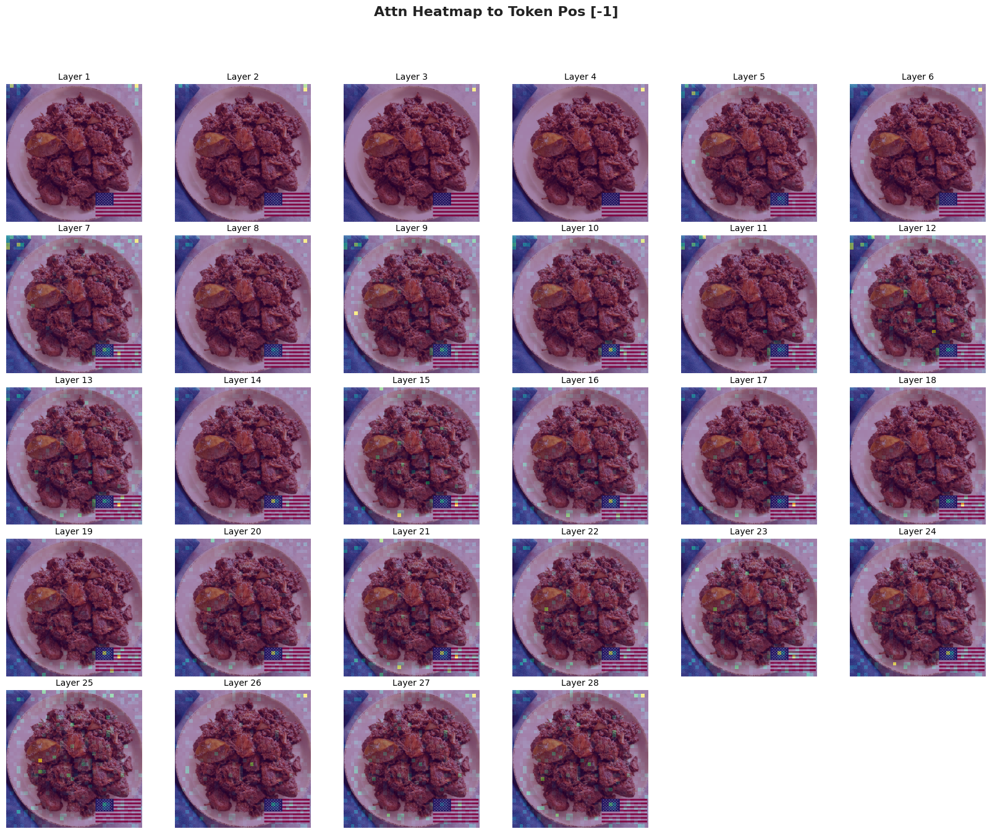

The dish in the picture appears to be a type of stew or curry, possibly a variation of a


In [ ]:
IMG_PATH = "../files/image1.png"
RESULTS_DIR = None

Q1 = "What is the name of this traditional dish?"
Q2 = "From which country does this cuisine originate from?"

predicted_answer_1 = process_single_sample(model, processor, IMG_PATH, Q1, RESULTS_DIR, token_pos=None, alpha=0.5)
print(predicted_answer_1)
predicted_answer_2 = process_single_sample(model, processor, IMG_PATH, Q2, RESULTS_DIR, token_pos=None, alpha=0.5)
print(predicted_answer_2)